# Classify3D -- Tank Version

## This is the workflow to segment objects in point cloud images, and identify tanks. The instruction is brief. A similar workflow instruction can be found in pipe_finder_notebook in the same directory. 

In [2]:
import laspy
import scipy
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn import preprocessing
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import path

Load the data. Find the data size, and the 3D box size. 

In [23]:
inFile = laspy.file.File('data_tanks/sample1.las')

dataset = np.vstack([inFile.x, inFile.y, inFile.z, inFile.red, inFile.green, inFile.blue]).transpose()
print("datasize: ", dataset.shape)


max1 = dataset[:,0].max()
min1 = dataset[:,0].min()

max2 = dataset[:,1].max()
min2 = dataset[:,1].min()

max3 = dataset[:,2].max()
min3 = dataset[:,2].min()

print(dataset[:,0].min(),dataset[:, 0].max())
print(dataset[:,1].min(),dataset[:, 1].max())
print(dataset[:,2].min(),dataset[:, 2].max())

datasize:  (500000, 6)
673215.0 673268.125
5721543.5 5721596.0
92.81999969482422 101.53699969482422


In [24]:
color = dataset[:,3:6]/65535
color.shape

(500000, 3)

In [25]:
dataset1 = dataset[:,0:3]
dataset1[:,1] = dataset1[:,1]  * 0.2
dataset1.shape

(500000, 3)

Make the first plot, and do DBSCAN, and find the number of clusters, number of points of each cluster, and choose the top candidate for tanks. I skip the details, which can be seen in pipe_finder_notebook! 

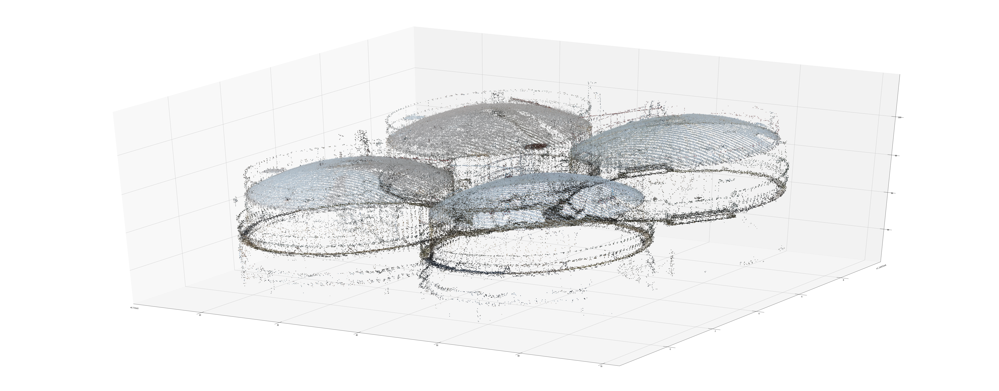

In [26]:
fig = plt.figure(figsize=[100, 40])
ax = fig.add_subplot(111, projection='3d')
col = [0, 0, 1]
ax.scatter(dataset1[:, 0], dataset1[:, 1], dataset1[:, 2], c= color, marker=".")

#plt.title('Estimated number of cluster: %d' % n_clusters_)
plt.show()

## Step 1: Segmentation/Clustering. 

In [27]:
# eps = 0.24 is good!
clustering = DBSCAN(eps=0.25, min_samples=100, leaf_size=10).fit(dataset1)

In [29]:
core_samples_mask = np.zeros_like(clustering.labels_, dtype=bool)
core_samples_mask[clustering.core_sample_indices_] = True
labels = clustering.labels_
# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 42
Estimated number of noise points: 76211


In [30]:
unique_labels = set(labels)
classfication = []
for k in unique_labels:
    class_member_mask = (labels == k)
    xyz = dataset1[class_member_mask & core_samples_mask]
    classfication.append(len(xyz))
    #print(len(xyz))

print(classfication)
print(max(classfication))

[82218, 93326, 86347, 103376, 21464, 134, 187, 1148, 112, 410, 50, 46, 137, 203, 71, 55, 77, 15, 49, 305, 11, 263, 106, 22, 15, 5, 17, 28, 4, 9, 39, 44, 4, 11, 1, 1, 69, 3, 5, 1, 5, 2, 0]
103376


Now you can selet the top candidates of tanks. 

In [31]:
#top5 = np.argsort(classfication)[-5:]
#top5

top_class = [classfication.index(x) for x in classfication if x>=0.1 * max(classfication)]
print(top_class)
top_number = len(top_class)

[0, 1, 2, 3, 4]


and make a plot for the selected objects (top candidates for tanks). 

0 (0.9914648212226067, 0.677354863514033, 0.37808535178777386, 1.0)
82218
1 (0.9990003844675125, 0.9690119184928874, 0.697039600153787, 1.0)
93326
2 (0.7840061514802001, 0.9128027681660901, 0.6200692041522491, 1.0)
86347
3 (0.34402153018069975, 0.6983467896962706, 0.6728950403690889, 1.0)
103376
4 (0.3686274509803922, 0.30980392156862746, 0.6352941176470588, 1.0)
21464


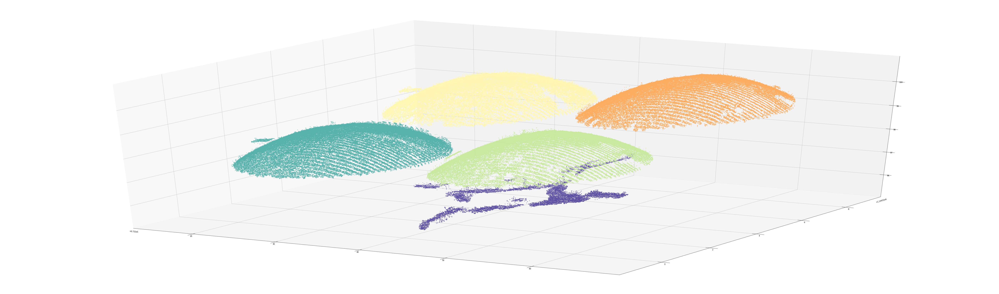

In [32]:
from matplotlib.axes._axes import _log as matplotlib_axes_logger
matplotlib_axes_logger.setLevel('ERROR')

fig = plt.figure(figsize=[100, 30])
ax = fig.add_subplot(111, projection='3d')
unique_labels = set(labels)

colors = [plt.cm.Spectral(each)
  for each in np.linspace(0.3, 1, top_number)]

#print(colors)

for i,col in zip(range(0,top_number),colors):
    k = top_class[i]
    print(k,col)
    class_member_mask = (labels == k)
    
    #print(k,class_member_mask)
    if k in top_class:
    #if k == 1:
        xyz = dataset1[class_member_mask & core_samples_mask]
        print(len(xyz))
        ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=col, marker=".")

plt.show()

And do 2D projections. The procedure is very similar to the pipe-finder pipeline. 

82218
93326
86347
103376
21464


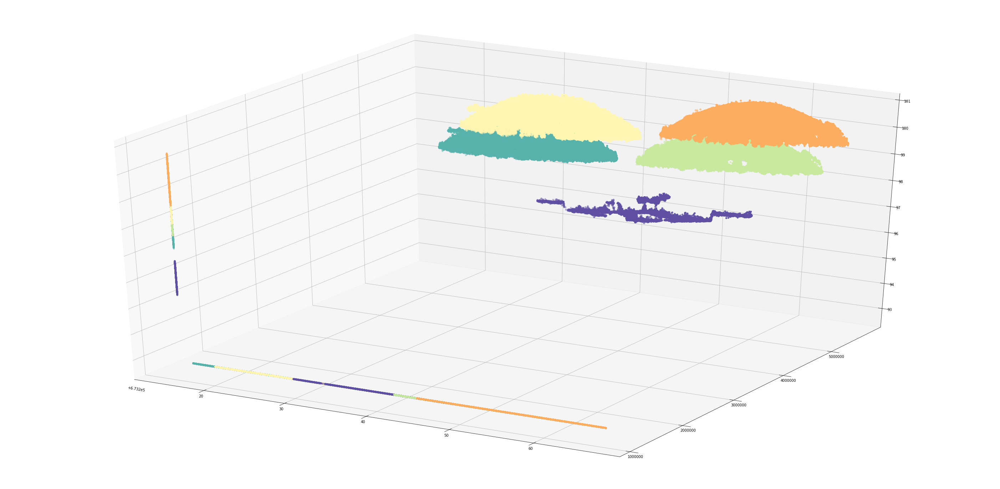

In [35]:
fig = plt.figure(figsize=[50, 25])
ax = fig.add_subplot(111, projection='3d')
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
  for each in np.linspace(0.3, 1, top_number)]

for i,col in zip(range(0,top_number),colors):
    k = top_class[i]
    if k == -1:
        # Black used for noise.
        col = [0, 0, 1]
    class_member_mask = (labels == k)
    
    #print(k,class_member_mask)
    if k in top_class:
    #if k == 0:
        xyz = dataset1[class_member_mask & core_samples_mask]
        print(len(xyz))
        
        xflat = np.full_like(xyz[:, 0], min1)
        yflat = np.full_like(xyz[:, 1], max2)
        zflat = np.full_like(xyz[:, 2], min3)
        
        ax.scatter(xflat, xyz[:, 1], xyz[:, 2], c=col)
        ax.scatter(xyz[:, 0], yflat, xyz[:, 2], c=col)
        ax.scatter(xyz[:, 0], xyz[:, 1], zflat, c=col)
        
        #ax.plot(xyz[:, 0], xyz[:, 1], c=col, zdir='z', zs=min3-0.5)
        #ax.plot(xyz[:, 0], xyz[:, 2], c=col, marker=".", markersize=0.01, zdir='y', zs= max2)
        #ax.plot(xyz[:, 1], xyz[:, 2], c=col, marker=".", markersize=0.1, zdir='x', zs= min1)
        
        #ax.set_xlim([min1, max1])
        #ax.set_ylim([min2, max2])
        #ax.set_zlim([min3, max3])

plt.show()

Collect 2D projections to xy-plans, and find the best candidates for tanks, using openCV ORB tool. 

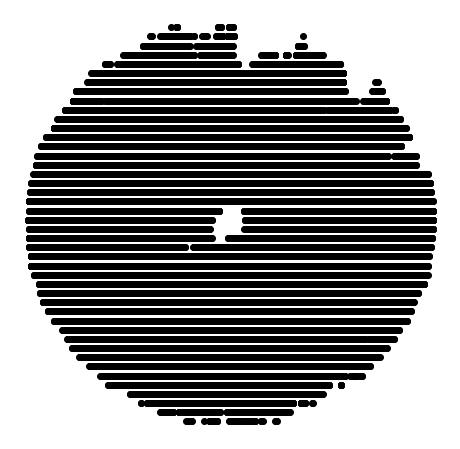

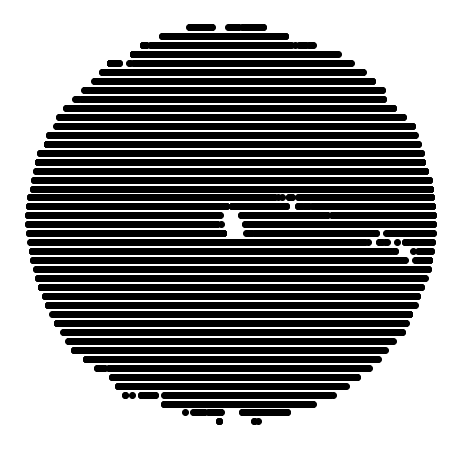

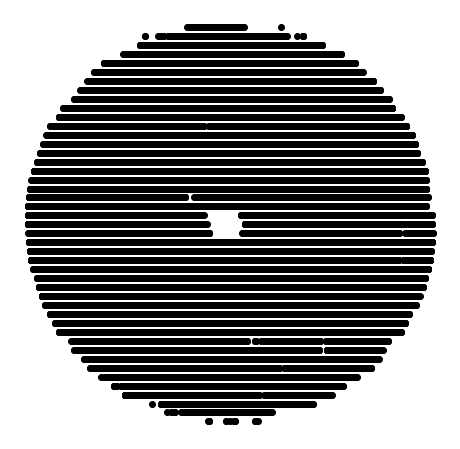

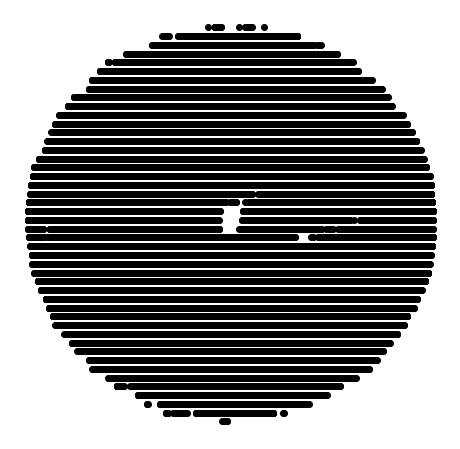

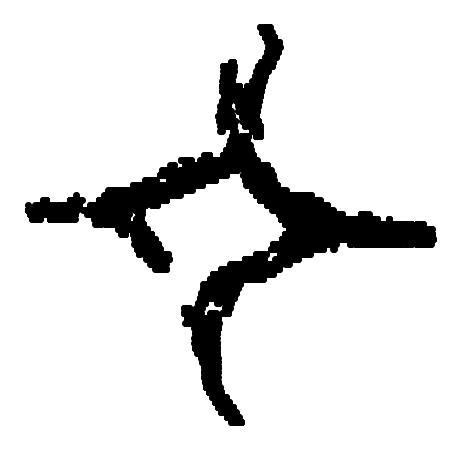

In [36]:
from numpy.polynomial.polynomial import polyfit
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import cv2
import warnings

image_tot = [[0]]*len(top_class)
fig = [[0]]*len(top_class)

warnings.simplefilter("ignore", DeprecationWarning)


min_residual = 1.e8
pipe_index = 0

#fig = plt.figure()
unique_labels = set(labels)
colors = [plt.cm.Spectral(each)
  for each in np.linspace(0.3, 1, top_number)]

#for k, col in zip(unique_labels, colors):
for i,col in zip(range(0,top_number),colors):
    
    fig[i] = plt.figure(figsize=[8, 8])
    ax = fig[i].add_subplot(111)
    
    canvas = FigureCanvas(fig[i])
    
    k = top_class[i]
    class_member_mask = (labels == k)
    
    #print(k,class_member_mask)
    if k in top_class:
    #if k==4:
        xyz = dataset1[class_member_mask & core_samples_mask]
        
        XX = xyz[:,0]
        YY = xyz[:,1]
        ZZ = xyz[:,2]
        
        YY2D = YY
        
        XX_lenth = XX.max()-XX.min()
        YY_lenth = YY.max()-YY.min()
        ZZ_lenth = ZZ.max()-ZZ.min()
        
        ax.scatter(XX, YY2D, c='k')
        # Turn off tick labels
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.axis('off')
        
        canvas.draw()     
        
        #print(i)
        
        image = np.fromstring(fig[i].canvas.tostring_rgb(), dtype=np.uint8, sep='')
        image = image.reshape(fig[i].canvas.get_width_height()[::-1] + (3,))
        image_tot[i] = cv2.cvtColor(image,cv2.COLOR_RGB2BGR)


In [37]:
sample_index = 1

# the sample image which is confirmed to be the 2D projection of a tank
img_sample = image_tot[sample_index]

# to select the clustering indices which are tanks
tank_index = []
tank_index.append(sample_index)

for i in range(0,len(top_class)):
    
    img_compare = image_tot[i]
    
    orb = cv2.ORB_create()
    
    kp_a, desc_a = orb.detectAndCompute(img_sample, None)
    kp_b, desc_b = orb.detectAndCompute(img_compare, None)
    
    # initialize the bruteforce matcher
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

    # match.distance is a float between {0:100} - lower means more similar
    matches = bf.match(desc_a, desc_b)
    similar_regions = [i for i in matches if i.distance < 40]
    if len(matches) == 0:
        print(0)
    score = len(similar_regions)/len(matches) 
    print(top_class[i],score)
    if (score > 0.1) & (i not in tank_index) :
        tank_index.append(top_class[i])
    
print(tank_index)

0 0.36403508771929827
1 1.0
2 0.6848739495798319
3 0.4423076923076923
4 0.027777777777777776
[1, 0, 2, 3]


0 82218
1 93326
2 86347
3 103376


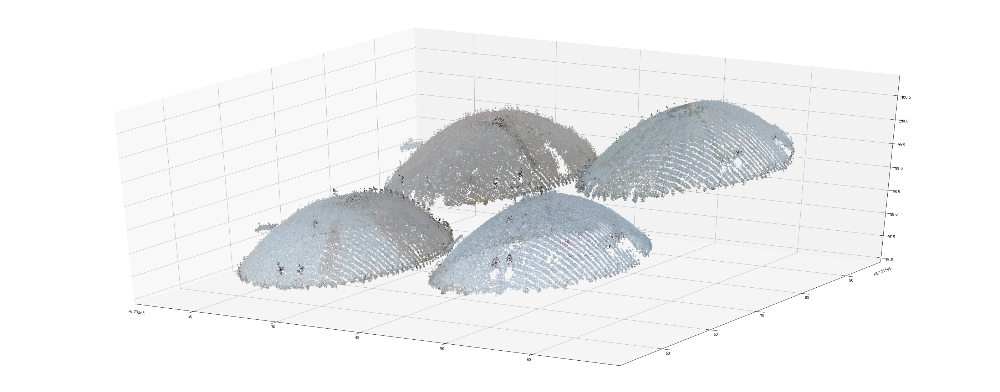

In [38]:
fig = plt.figure(figsize=[50, 20])
ax = fig.add_subplot(111, projection='3d')

# This array to store tanks' position, tank_data[i] is the ith tank
tank_data = [[0]]*len(tank_index)
MM = 0

colors = [plt.cm.Spectral(each)
  for each in np.linspace(0.3, 1, top_number)]

#print(colors)

for i,col in zip(range(0,top_number),colors):
    k = top_class[i]
    #print(k,col)
    class_member_mask = (labels == k)
    col_pipe = color[class_member_mask & core_samples_mask]
    
    if k in tank_index:
    #if k == 1:
        xyz = dataset1[class_member_mask & core_samples_mask]
        print(k,len(xyz))
        xyz[:, 1] = xyz[:, 1]/0.2
        tank_data[MM] = xyz
        MM += 1
        ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=col_pipe, marker=".")

plt.show()

In [39]:
# example to show tank data
tank_data[1]

array([[6.73225000e+05, 5.72159050e+06, 9.90959997e+01],
       [6.73227063e+05, 5.72157950e+06, 9.93239997e+01],
       [6.73226063e+05, 5.72158050e+06, 9.93229997e+01],
       ...,
       [6.73228188e+05, 5.72158300e+06, 9.96179997e+01],
       [6.73234750e+05, 5.72158950e+06, 9.95389997e+01],
       [6.73227000e+05, 5.72159150e+06, 9.92319997e+01]])